# Imports y Preparacion del dataset

In [137]:
import pandas as pd
import numpy as np
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn as sk
import sklearn.preprocessing as skp
import scipy.stats as stats
import scipy as sc
from sklearn.feature_extraction import FeatureHasher
from sklearn.feature_selection import VarianceThreshold
from sklearn.impute import KNNImputer, SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.metrics import confusion_matrix, classification_report

#joblib
#from joblib import dump, load
import joblib

# multivariado   
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.neighbors import DistanceMetric

from sklearn import metrics

from sklearn.metrics import precision_score, recall_score, accuracy_score,f1_score#, precision_recall_curve, roc_curve, 




In [138]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [139]:
df = pd.read_csv('/content/drive/MyDrive/Datasets/hotels_train.csv') 
df_test = pd.read_csv('/content/drive/MyDrive/Datasets/hotels_test.csv')
df_test_original = df_test.copy()
df_original = df.copy()


#Preprocesamiento

In [140]:
columnas = {"adr": "average_daily_rate", "arrival_date_year":"year", "arrival_date_month":"month", "arrival_date_day_of_month":"day"} #cambiar nombres a las categorias
df.rename(columns = columnas, inplace = True)
df = df.drop(columns=['arrival_date_week_number'])
#CAMBIO EL UNDEFINED A SC :)
df.loc[df.loc[:,"meal"]=='Undefined',"meal"]="SC"
#COUNTRY
df['country'] = df['country'].fillna("PRT")
paises_comunes = ['PRT','GBR','FRA','ESP','DEU','ITA','IRL', 'BRA', 'BEL', 'USA', 'NLD', 'CHE', 'CN', 'AUT', 'CHN', 'SWE', 'POL', 'RUS', 'ISR', 'NOR']
df.loc[~df.loc[:,"country"].isin(paises_comunes),"country"]="OTHER"
#TENEMOS QUE VER LOS 2 UNDEFINED 
df.drop(df[df['market_segment']=='Undefined'].index, axis='index',inplace=True)
df.drop(df[df['distribution_channel']=='Undefined'].index, axis='index',inplace=True)
#ROOM TYPES
room_type_populares = ["A", "D", "E", "F", "G"]
df.loc[~df.loc[:,"assigned_room_type"].isin(room_type_populares),"assigned_room_type"]="O"
df.loc[~df.loc[:,"reserved_room_type"].isin(room_type_populares),"reserved_room_type"]="O"
#ARRIVAL_DATE
months = {'January':1, 'February':2, 'March':3, 'April':4, 'May':5, 'June':6, 'July':7, 'August':8,'September':9, 'October':10,'November':11, 'December': 12 }
df.month = df.month.map(months)
arrivaldates = df.copy() 

date=arrivaldates.apply(lambda x: datetime.date(int(x['year']), x['month'], x['day']),axis=1)

date = pd.to_datetime(date)

df = df.drop(columns=['year', 'month', 'day'])

df.insert(0, 'arrival_date', date)

#DROP COMPANY
df= df.drop(columns=['company', 'reservation_status_date'])
#CHILDREN
df['children'] = df['children'].fillna(0.0)
df['children'] = df['children'].astype(int)
#AGENT
df['agent'] = df['agent'].fillna(9.0)
df['agent'] = df['agent'].astype(int)

#eliminamos el outlier porque una fila respecto a la gran cantidad de datos que tenemos no es relevante
df.drop(df[df['average_daily_rate']<0].index, axis='index',inplace=True)
df.drop(df[df['average_daily_rate']==0].index, axis='index',inplace=True)
#
df.drop(df[(df['babies']==0) & (df['adults']==0) & (df['children']==0)].index, axis='index',inplace=True)
df.drop(df[(df['babies']==0) & (df['adults']==0) & (df['children']==0)].index, axis='index',inplace=True)
#creamos una nueva col para verificar el tipo de habitacion
df['assigned_equals_reserved'] = np.where(df['assigned_room_type']== df['reserved_room_type'], True, False)
df['assigned_equals_reserved']=df['assigned_equals_reserved'].astype(int)
#TEMPORADA ALTA
temporada_alta = [1,6,7,8,12]
df['temporada_alta'] = pd.DatetimeIndex(df['arrival_date']).month.isin(temporada_alta)
df['temporada_alta'] = df['temporada_alta'] .astype(int)
#DUMMIES
dataset = df.copy()
dataset = pd.get_dummies(dataset, columns=["hotel","meal","deposit_type","customer_type","country"], drop_first=True)
dataset = pd.get_dummies(dataset, columns=["distribution_channel"], drop_first=True)
dataset = pd.get_dummies(dataset, columns=["market_segment"], drop_first=True)

In [141]:
df_test.rename(columns = columnas, inplace = True)
df_test = df_test.drop(columns=['arrival_date_week_number'])
#CAMBIO EL UNDEFINED A SC :)
df_test.loc[df_test.loc[:,"meal"]=='Undefined',"meal"]="SC"
#COUNTRY
df_test['country'] = df_test['country'].fillna("PRT")
df_test.loc[~df_test.loc[:,"country"].isin(paises_comunes),"country"]="OTHER"

#TENEMOS QUE VER LOS 2 UNDEFINED 
df_test.drop(df_test[df_test['market_segment']=='Undefined'].index, axis='index',inplace=True)
df_test.drop(df_test[df_test['distribution_channel']=='Undefined'].index, axis='index',inplace=True)
#ROOM TYPES
df_test.loc[~df_test.loc[:,"assigned_room_type"].isin(room_type_populares),"assigned_room_type"]="O"
df_test.loc[~df_test.loc[:,"reserved_room_type"].isin(room_type_populares),"reserved_room_type"]="O"
#ARRIVAL_DATE
df_test.month = df_test.month.map(months)
arrivaldates = df_test.copy()
date=arrivaldates.apply(lambda x: datetime.date(int(x['year']), x['month'], x['day']),axis=1)
date = pd.to_datetime(date)
df_test = df_test.drop(columns=['year', 'month', 'day'])
df_test.insert(0, 'arrival_date', date)
#DROP COMPANY
df_test= df_test.drop(columns=['company'])

#CHILDREN
df_test['children'] = df_test['children'].fillna(0.0)
df_test['children'] = df_test['children'].astype(int)
#AGENT
df_test['agent'] = df_test['agent'].fillna(9.0)
df_test['agent'] = df_test['agent'].astype(int)

#eliminamos el outlier porque una fila respecto a la gran cantidad de datos que tenemos no es relevante
df_test.drop(df_test[df_test['average_daily_rate']<0].index, axis='index',inplace=True)
df_test.drop(df_test[df_test['average_daily_rate']==0].index, axis='index',inplace=True)
#
df_test.drop(df_test[(df_test['babies']==0) & (df_test['adults']==0) & (df_test['children']==0)].index, axis='index',inplace=True)
df_test.drop(df_test[(df_test['babies']==0) & (df_test['adults']==0) & (df_test['children']==0)].index, axis='index',inplace=True)
#creamos una nueva col para verificar el tipo de habitacion
df_test['assigned_equals_reserved'] = np.where(df_test['assigned_room_type']== df_test['reserved_room_type'], True, False) 
df_test['assigned_equals_reserved']=df_test['assigned_equals_reserved'].astype(int)
#TEMPORADA_ALTA
df_test['temporada_alta'] = pd.DatetimeIndex(df_test['arrival_date']).month.isin(temporada_alta)
df_test['temporada_alta'] = df_test['temporada_alta'] .astype(int)

df_test = pd.get_dummies(df_test, columns=["hotel","meal","deposit_type","customer_type","country"], drop_first=True)
df_test = pd.get_dummies(df_test, columns=["distribution_channel"], drop_first=True)
df_test = pd.get_dummies(df_test, columns=["market_segment"], drop_first=True)


# CHECKPOINT 2


Aca arrancamos con arboles :)


In [142]:
target='is_canceled'

In [143]:
#Verifico balanceo de clases
dataset[target].value_counts(normalize=True)*100

1    50.451558
0    49.548442
Name: is_canceled, dtype: float64

# Arbol de decision N1

In [144]:
features1= ['hotel_Resort Hotel','meal_FB','meal_HB','meal_SC','lead_time', 'adults', 'children', 'babies', 'previous_cancellations','days_in_waiting_list']

In [145]:
#Separo un set de Evaluacion 
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(dataset[features1].values, 
                                                    dataset[target].values, 
                                                    test_size=0.2,    #20% al conjunto de test 80/20
                                                    random_state=13,  #para poder reproducir el experimento
                                                    stratify=dataset[target].values) #estratificado para mantener proporcion 

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

#Verifico como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48808
# Datos Prueba: 12203
% Positivos Entrenamiento: 50.451
% Positivos Prueba: 50.455


In [146]:
dataset.shape

(61011, 60)

In [147]:
##KFOLD CV Random Search para buscar el mejor arbol 
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer

#Cantidad de combinaciones que quiero porbar
n=30 

#Conjunto de parámetros que quiero usar 
params_grid = {'criterion':['gini','entropy'], #LE DOY POSIBLES CRITERIOS DE PARAMETROS 
               #'min_samples_leaf':list(range(1,10)),
               #'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0,0.005,n), #UN RANGO DE ALPHA(PODA) CON N CORTES
               'max_depth':list(range(1,8))} #RANGO DE PROFUNDIDAD
                
#Cantidad de splits para el Cross Validation
folds=20 

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds)  

#Clasificador  
base_tree = DecisionTreeClassifier() 

#Metrica que quiero optimizar F1 Score
scorer_fn = make_scorer(sk.metrics.f1_score) 

#Random Search Cross Validation 
randomcv = RandomizedSearchCV(estimator=base_tree, 
                              param_distributions = params_grid,
                              scoring=scorer_fn, 
                              cv=kfoldcv,
                              n_iter=n) 

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train);

In [148]:
#Mejores hiperparametros del arbol 
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_) 

{'max_depth': 2, 'criterion': 'entropy', 'ccp_alpha': 0.0008620689655172415}
0.7083414460033527


In [149]:
#Atributos considerados y su importancia
best_tree = randomcv.best_estimator_ 
feat_imps = best_tree.feature_importances_ 

for feat_imp,feat in sorted(zip(feat_imps,features1)): 
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

previous_cancellations: 0.4083037242156198
lead_time: 0.5916962757843802


In [150]:
#Creo el árbol con los mejores hiperparámetros
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

arbol=DecisionTreeClassifier().set_params(**randomcv.best_params_)

#Entreno el arbol en todo el set
arbol.fit(x_train,y_train) 

reglas = export_text(arbol, feature_names=list(features1)) #IMPRIMO TODAS LAS REGLAS
print(reglas)

|--- lead_time <= 17.50
|   |--- lead_time <= 7.50
|   |   |--- class: 0
|   |--- lead_time >  7.50
|   |   |--- class: 0
|--- lead_time >  17.50
|   |--- previous_cancellations <= 0.50
|   |   |--- class: 1
|   |--- previous_cancellations >  0.50
|   |   |--- class: 1



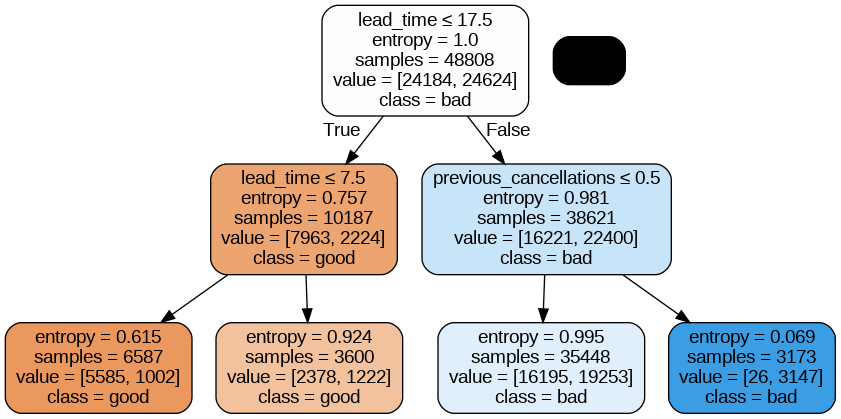

In [151]:
from six import StringIO #IMPRIMO EL ARBOL
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
import matplotlib.pyplot as plt

dot_data = StringIO()
export_graphviz(arbol, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names=features1,
                class_names=['good','bad'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [152]:
#Realizamos una predicción sobre el set de test
y_pred = arbol.predict(x_test)
#Valores Predichos
y_pred

array([1, 1, 1, ..., 1, 0, 1])

In [153]:
print('correctas: ', np.sum(y_test == y_pred))
print('total: ', len(y_test))

correctas:  7587
total:  12203


In [154]:
accuracy=accuracy_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred,)
precision=precision_score(y_test,y_pred)

print("Accuracy: "+str(accuracy)) 
print("Recall: "+str(recall))
print("Precision: "+str(precision))
print("f1 score: "+str(f1))

Accuracy: 0.621732360894862
Recall: 0.9049861945752802
Precision: 0.580235343121941
f1 score: 0.7071065989847717


In [155]:
joblib.dump(arbol, 'arbol1.pkl')

['arbol1.pkl']

# Arbol de decision N2

In [156]:
features2= ['lead_time','previous_cancellations','booking_changes','previous_bookings_not_canceled', 'stays_in_week_nights','days_in_waiting_list']

In [157]:
x_train, x_test, y_train, y_test = train_test_split(dataset[features2].values, 
                                                    dataset[target].values, 
                                                    test_size=0.2,    #20% al conjunto de test 80/20
                                                    random_state=13,  #para poder reproducir el experimento
                                                    stratify=dataset[target].values) #estratificado para mantener proporcion

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

#Verifico como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48808
# Datos Prueba: 12203
% Positivos Entrenamiento: 50.451
% Positivos Prueba: 50.455


In [158]:
##KFOLD CV Random Search para buscar el mejor arbol (los mejores atributos, hiperparametros,etc)
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer

#Cantidad de combinaciones que quiero porbar
n=30 

#Conjunto de parámetros que quiero usar 
params_grid = {'criterion':['gini','entropy'], #LE DOY POSIBLES CRITERIOS DE PARAMETROS 
               #'min_samples_leaf':list(range(1,10)),
               #'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0.001,0.005,n), #UN RANGO DE ALPHA(PODA) CON N CORTES, AUNQUE PODIA SER UN N MAYOR A 10
               'max_depth':list(range(1,6))} #RANGO DE PROFUNDIDAD
                
#Cantidad de splits para el Cross Validation
folds=45 

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds) 

#Clasificador ARMO MI CLASIFICADOR 
base_tree = DecisionTreeClassifier() 

#Metrica que quiero optimizar F1 Score
scorer_fn = make_scorer(sk.metrics.f1_score) 

#Random Search Cross Validation BUSCADOR RANDOM CON VALIDACION CRUZADA
randomcv = RandomizedSearchCV(estimator=base_tree, #CREO MI VALIDACION CRUZADA con busqueda random de hiperparametros RANDOM SEARCH
                              param_distributions = params_grid,
                              scoring=scorer_fn, #METRICA QUE QUUIERO OPTIMIZAR
                              cv=kfoldcv,
                              n_iter=n)  

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train); 

In [159]:
#Mejores hiperparametros del arbol 
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_) 

{'max_depth': 5, 'criterion': 'entropy', 'ccp_alpha': 0.0011379310344827587}
0.7232483612314597


In [160]:
#Atributos considerados y su importancia
best_tree = randomcv.best_estimator_ #ME DEVUELVE MI MEJOR ARBOL
feat_imps = best_tree.feature_importances_ #AL MEJOR ARBOL LE PIDO SUS MEJORES FEATURES

for feat_imp,feat in sorted(zip(feat_imps,features2)):
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

stays_in_week_nights: 0.018240557332971502
previous_bookings_not_canceled: 0.04436899561263551
booking_changes: 0.13919575622169486
previous_cancellations: 0.3061238800964075
lead_time: 0.49207081073629055


# Arbol de decision N3

In [161]:
features3= ['lead_time','previous_cancellations','booking_changes', 'previous_bookings_not_canceled','days_in_waiting_list' ]

In [162]:
x_train, x_test, y_train, y_test = train_test_split(dataset[features3].values, 
                                                    dataset[target].values, 
                                                    test_size=0.2,    #20% al conjunto de test 80/20
                                                    random_state=13,  #para poder reproducir el experimento
                                                    stratify=dataset[target].values) #estratificado para mantener proporcion #QUEREMOS QUE SE RESPETE LA DIST DE LAS CLASES, APRENDER DE LAS 2 CLASES

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

#Verifico como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48808
# Datos Prueba: 12203
% Positivos Entrenamiento: 50.451
% Positivos Prueba: 50.455


In [163]:
##KFOLD CV Random Search para buscar el mejor arbol (los mejores atributos, hiperparametros,etc)
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer

#Cantidad de combinaciones que quiero porbar
n=20 

#Conjunto de parámetros que quiero usar GRILLA DE PARAMETROS
params_grid = {'criterion':['gini','entropy'], #LE DOY POSIBLES CRITERIOS DE PARAMETROS 
               #'min_samples_leaf':list(range(1,10)),
               #'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0.001,0.005,n), #UN RANGO DE ALPHA(PODA) CON N CORTES, AUNQUE PODIA SER UN N MAYOR A 10
               'max_depth':list(range(2,12))} #RANGO DE PROFUNDIDAD
                
#Cantidad de splits para el Cross Validation
folds=25 

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds)

#Clasificador ARMO MI CLASIFICADOR 
base_tree = DecisionTreeClassifier() 

#Metrica que quiero optimizar F1 Score
scorer_fn = make_scorer(sk.metrics.f1_score) #ACA DECIDO QUE MI MEJOR CONJUNTO SEA A BSAE DE MEDIR F1 SCORE 

#Random Search Cross Validation BUSCADOR RANDOM CON VALIDACION CRUZADA
randomcv = GridSearchCV(estimator=base_tree, #CREO MI VALIDACION CRUZADA con busqueda random de hiperparametros RANDOM SEARCH
                              param_grid = params_grid,
                              scoring=scorer_fn, #METRICA QUE QUUIERO OPTIMIZAR
                              cv=kfoldcv,
                              n_jobs=n) #LO TENER QUE HACER 10 VECES, PORQUE ES LA CANT DE HIPERPARAMETROS  

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train); #LO ENTRENO SOBRE MI DATASET DE ENTRENAMIENTO

In [164]:
#Mejores hiperparametros del arbol PROBASTE 10 DECIME CUAL FUE EL DE LA MEJOR METRICAS
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_) #EL ARBOL QUE MEJOR PERFORMO TIENE ESTO, AL SER RANDOM, AL VOLVER A CORRER PUEDE QUE ME DEN OTROS, EN ESTE CASO F1, SI DA MUY BAJO PUEDO MODIFICAR MIS PARAMETRO

{'ccp_alpha': 0.001, 'criterion': 'entropy', 'max_depth': 5}
0.7230832395837093


In [165]:
#Atributos considerados y su importancia
best_tree = randomcv.best_estimator_ #ME DEVUELVE MI MEJOR ARBOL
feat_imps = best_tree.feature_importances_ #AL MEJOR ARBOL LE PIDO SUS MEJORES FEATURES

for feat_imp,feat in sorted(zip(feat_imps,features3)): #ME DIJO CON EL ALCOHOL Y SULFATOS TE PUEDO ARMAR UN BUEN CLASIFICADOR (EL ALCOHOL TIENE BUENA CORRELACION CON EL TARGET LO VIMOS EN EL HEATMAP)
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

previous_bookings_not_canceled: 0.04481537762937892
booking_changes: 0.14059615939797654
previous_cancellations: 0.30920369276928744
lead_time: 0.5053847702033573


In [166]:
#Creo el árbol con los mejores hiperparámetros
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

arbol=DecisionTreeClassifier().set_params(**randomcv.best_params_)

#Entreno el arbol en todo el set
arbol.fit(x_train,y_train) #LO ENTRENO CON TODO EL SET DE ENTRENAMIENTO

reglas = export_text(arbol, feature_names=list(features3)) #IMPRIMO TODAS LAS REGLAS
print(reglas)

|--- lead_time <= 17.50
|   |--- lead_time <= 7.50
|   |   |--- booking_changes <= 0.50
|   |   |   |--- previous_cancellations <= 0.50
|   |   |   |   |--- previous_bookings_not_canceled <= 0.50
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- previous_bookings_not_canceled >  0.50
|   |   |   |   |   |--- class: 0
|   |   |   |--- previous_cancellations >  0.50
|   |   |   |   |--- previous_bookings_not_canceled <= 2.50
|   |   |   |   |   |--- class: 1
|   |   |   |   |--- previous_bookings_not_canceled >  2.50
|   |   |   |   |   |--- class: 0
|   |   |--- booking_changes >  0.50
|   |   |   |--- class: 0
|   |--- lead_time >  7.50
|   |   |--- previous_cancellations <= 0.50
|   |   |   |--- class: 0
|   |   |--- previous_cancellations >  0.50
|   |   |   |--- previous_bookings_not_canceled <= 1.50
|   |   |   |   |--- class: 1
|   |   |   |--- previous_bookings_not_canceled >  1.50
|   |   |   |   |--- class: 0
|--- lead_time >  17.50
|   |--- previous_cancellations <= 0.50


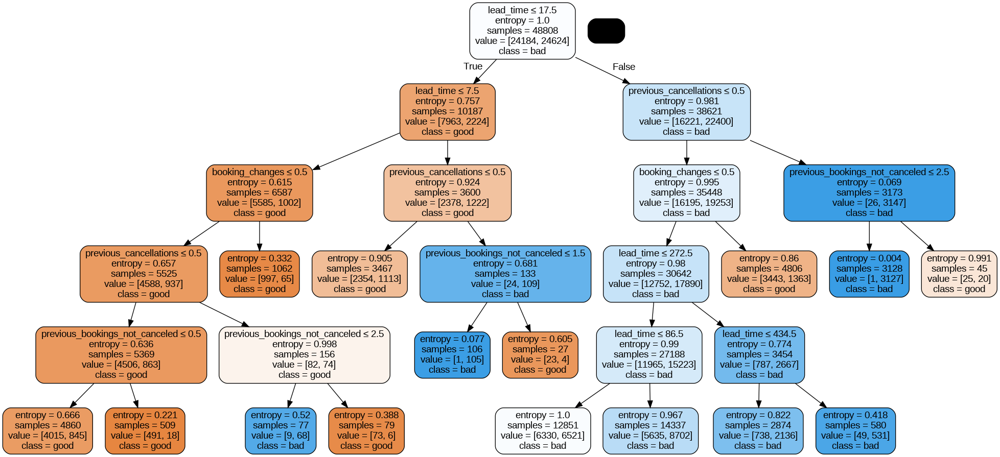

In [167]:
from six import StringIO #IMPRIMO EL ARBOL
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
import matplotlib.pyplot as plt

dot_data = StringIO()
export_graphviz(arbol, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names=features3,
                class_names=['good','bad'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [168]:
df_test.dtypes

arrival_date                      datetime64[ns]
lead_time                                  int64
stays_in_weekend_nights                    int64
stays_in_week_nights                       int64
adults                                     int64
children                                   int64
babies                                     int64
is_repeated_guest                          int64
previous_cancellations                     int64
previous_bookings_not_canceled             int64
reserved_room_type                        object
assigned_room_type                        object
booking_changes                            int64
agent                                      int64
days_in_waiting_list                       int64
average_daily_rate                       float64
required_car_parking_spaces                int64
total_of_special_requests                  int64
reservation_status_date                   object
id                                        object
assigned_equals_rese

In [169]:
prueba = df_test.copy()

In [170]:
filas_totales=df_test.shape[0]
print(df_test.isna().sum()/filas_totales*100) 

arrival_date                      0.0
lead_time                         0.0
stays_in_weekend_nights           0.0
stays_in_week_nights              0.0
adults                            0.0
children                          0.0
babies                            0.0
is_repeated_guest                 0.0
previous_cancellations            0.0
previous_bookings_not_canceled    0.0
reserved_room_type                0.0
assigned_room_type                0.0
booking_changes                   0.0
agent                             0.0
days_in_waiting_list              0.0
average_daily_rate                0.0
required_car_parking_spaces       0.0
total_of_special_requests         0.0
reservation_status_date           0.0
id                                0.0
assigned_equals_reserved          0.0
temporada_alta                    0.0
hotel_Resort Hotel                0.0
meal_FB                           0.0
meal_HB                           0.0
meal_SC                           0.0
deposit_type

In [171]:
prueba = df_test[['lead_time','previous_cancellations','booking_changes', 'previous_bookings_not_canceled', 'days_in_waiting_list' ]]

In [172]:
y_pred = arbol.predict(x_test)

In [173]:
accuracy=accuracy_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)

print("Accuracy: "+str(accuracy)) 
print("Recall: "+str(recall))
print("Precision: "+str(precision))
print("f1 score: "+str(f1))

Accuracy: 0.6742604277636647
Recall: 0.8604840019490011
Precision: 0.6296648443071072
f1 score: 0.7271978587605518


In [174]:
predicciones = arbol.predict(prueba)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


In [175]:
predicciones

array([1, 1, 0, ..., 1, 1, 1])

In [176]:
predicciones.size

26193

In [177]:
df_test.shape

(26193, 60)

In [178]:
df_test.columns

Index(['arrival_date', 'lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'agent',
       'days_in_waiting_list', 'average_daily_rate',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status_date', 'id', 'assigned_equals_reserved',
       'temporada_alta', 'hotel_Resort Hotel', 'meal_FB', 'meal_HB', 'meal_SC',
       'deposit_type_Non Refund', 'deposit_type_Refundable',
       'customer_type_Group', 'customer_type_Transient',
       'customer_type_Transient-Party', 'country_BEL', 'country_BRA',
       'country_CHE', 'country_CHN', 'country_CN', 'country_DEU',
       'country_ESP', 'country_FRA', 'country_GBR', 'country_IRL',
       'country_ISR', 'country_ITA', 'country_NLD', 'country_NOR',
       'country_OTHER', 'country_POL', 'coun

In [179]:
df_submission = pd.DataFrame({'id':df_test['id'], 'is_canceled':predicciones})
df_submission.head()
df_submission.shape


(26193, 2)

#Arbol de decision N4

In [180]:
dataset.columns

Index(['arrival_date', 'lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'agent',
       'days_in_waiting_list', 'average_daily_rate',
       'required_car_parking_spaces', 'total_of_special_requests', 'id',
       'is_canceled', 'assigned_equals_reserved', 'temporada_alta',
       'hotel_Resort Hotel', 'meal_FB', 'meal_HB', 'meal_SC',
       'deposit_type_Non Refund', 'deposit_type_Refundable',
       'customer_type_Group', 'customer_type_Transient',
       'customer_type_Transient-Party', 'country_BEL', 'country_BRA',
       'country_CHE', 'country_CHN', 'country_CN', 'country_DEU',
       'country_ESP', 'country_FRA', 'country_GBR', 'country_IRL',
       'country_ISR', 'country_ITA', 'country_NLD', 'country_NOR',
       'country_OTHER', 'country_POL', 'country_PRT', 'c

In [181]:
features4= ['lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest',
       'previous_cancellations', 'previous_bookings_not_canceled','booking_changes',
        'days_in_waiting_list',
       'average_daily_rate', 'required_car_parking_spaces',
       'total_of_special_requests', 'hotel_Resort Hotel',
       'meal_FB', 'meal_HB', 'meal_SC']

In [182]:
x_train, x_test, y_train, y_test = train_test_split(dataset[features4].values, 
                                                    dataset[target].values, 
                                                    test_size=0.2,    #20% al conjunto de test 80/20
                                                    random_state=13,  #para poder reproducir el experimento
                                                    stratify=dataset[target].values) #estratificado para mantener proporcion #QUEREMOS QUE SE RESPETE LA DIST DE LAS CLASES, APRENDER DE LAS 2 CLASES

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

#Verifico como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48808
# Datos Prueba: 12203
% Positivos Entrenamiento: 50.451
% Positivos Prueba: 50.455


In [183]:
##KFOLD CV Random Search para buscar el mejor arbol (los mejores atributos, hiperparametros,etc)
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer

#Cantidad de combinaciones que quiero porbar
n=30 #LE PIDO QUE ME ARME 20 COMB POR CADA SPLIT(ENTRENA 20 ARBOLES POR CADA SPLIT)

#Conjunto de parámetros que quiero usar GRILLA DE PARAMETROS
params_grid = {'criterion':['gini','entropy'], #LE DOY POSIBLES CRITERIOS DE PARAMETROS 
               #'min_samples_leaf':list(range(1,10)),
               #'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0,0.005,n), #UN RANGO DE ALPHA(PODA) CON N CORTES, AUNQUE PODIA SER UN N MAYOR A 10
               'max_depth':list(range(10,18))} #RANGO DE PROFUNDIDAD
                
#Cantidad de splits para el Cross Validation
folds=40 #IGUAL QUE EN EL DIBUJO CUANTAS CECES LO QUIERO PARTIR Y ENTRENAR

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds) #5 FOLDS ESTRATIFICADOS RESPETE LA PROPORCION DE LA CLASE, EN LA MISMA PROPORCION ORIGINAL 

#Clasificador ARMO MI CLASIFICADOR 
base_tree = DecisionTreeClassifier() 

#Metrica que quiero optimizar F1 Score
scorer_fn = make_scorer(sk.metrics.f1_score) #ACA DECIDO QUE MI MEJOR CONJUNTO SEA A BSAE DE MEDIR F1 SCORE 

#Random Search Cross Validation BUSCADOR RANDOM CON VALIDACION CRUZADA
randomcv = RandomizedSearchCV(estimator=base_tree, #CREO MI VALIDACION CRUZADA con busqueda random de hiperparametros RANDOM SEARCH
                              param_distributions = params_grid,
                              scoring=scorer_fn, #METRICA QUE QUUIERO OPTIMIZAR
                              cv=kfoldcv,
                              n_iter=n) #LO TENER QUE HACER 10 VECES, PORQUE ES LA CANT DE HIPERPARAMETROS  

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train); #LO ENTRENO SOBRE MI DATASET DE ENTRENAMIENTO

In [184]:
#Mejores hiperparametros del arbol PROBASTE 10 DECIME CUAL FUE EL DE LA MEJOR METRICAS
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_)

{'max_depth': 15, 'criterion': 'gini', 'ccp_alpha': 0.0}
0.754779350288403


In [185]:
#Atributos considerados y su importancia
best_tree = randomcv.best_estimator_ #ME DEVUELVE MI MEJOR ARBOL
feat_imps = best_tree.feature_importances_ #AL MEJOR ARBOL LE PIDO SUS MEJORES FEATURES

for feat_imp,feat in sorted(zip(feat_imps,features4)): #ME DIJO CON EL ALCOHOL Y SULFATOS TE PUEDO ARMAR UN BUEN CLASIFICADOR (EL ALCOHOL TIENE BUENA CORRELACION CON EL TARGET LO VIMOS EN EL HEATMAP)
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

babies: 0.0013536718442030147
is_repeated_guest: 0.0016613989429619374
meal_FB: 0.003543981856788857
children: 0.0058159370967786304
previous_bookings_not_canceled: 0.008635494493724177
meal_SC: 0.008642763524566291
meal_HB: 0.012789761720251485
adults: 0.013887712467703373
days_in_waiting_list: 0.013991180123506386
hotel_Resort Hotel: 0.018673599438085175
stays_in_weekend_nights: 0.022213092895061827
stays_in_week_nights: 0.04085261404473181
required_car_parking_spaces: 0.06045141580444006
previous_cancellations: 0.06267340458292547
booking_changes: 0.08526055400563007
total_of_special_requests: 0.16102735278285568
average_daily_rate: 0.16312626008850092
lead_time: 0.31539980428728503


In [186]:
#Creo el árbol con los mejores hiperparámetros
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

arbol4 =DecisionTreeClassifier().set_params(**randomcv.best_params_)

#Entreno el arbol en todo el set
arbol4.fit(x_train,y_train) #LO ENTRENO CON TODO EL SET DE ENTRENAMIENTO

reglas = export_text(arbol4, feature_names=list(features4)) #IMPRIMO TODAS LAS REGLAS
print(reglas)

|--- lead_time <= 17.50
|   |--- lead_time <= 7.50
|   |   |--- required_car_parking_spaces <= 0.50
|   |   |   |--- previous_cancellations <= 0.50
|   |   |   |   |--- total_of_special_requests <= 0.50
|   |   |   |   |   |--- booking_changes <= 0.50
|   |   |   |   |   |   |--- hotel_Resort Hotel <= 0.50
|   |   |   |   |   |   |   |--- average_daily_rate <= 60.69
|   |   |   |   |   |   |   |   |--- lead_time <= 1.50
|   |   |   |   |   |   |   |   |   |--- meal_SC <= 0.50
|   |   |   |   |   |   |   |   |   |   |--- average_daily_rate <= 59.00
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 5
|   |   |   |   |   |   |   |   |   |   |--- average_daily_rate >  59.00
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 2
|   |   |   |   |   |   |   |   |   |--- meal_SC >  0.50
|   |   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |--- lead_time >  1.50
|   |   |   |   |   |   |   |   |   |--- average_dail

In [187]:
y_pred = arbol4.predict(x_test)

In [188]:
accuracy=accuracy_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)

print("Accuracy: "+str(accuracy)) 
print("Recall: "+str(recall))
print("Precision: "+str(precision))
print("f1 score: "+str(f1))

Accuracy: 0.7608784725067607
Recall: 0.7323371771966867
Precision: 0.780238795639384
f1 score: 0.755529490616622


In [189]:
prueba4 = df_test[['lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest',
       'previous_cancellations', 'previous_bookings_not_canceled','booking_changes',
        'days_in_waiting_list',
       'average_daily_rate', 'required_car_parking_spaces',
       'total_of_special_requests', 'hotel_Resort Hotel',
       'meal_FB', 'meal_HB', 'meal_SC']]

In [190]:
predicciones4 = arbol4.predict(prueba4)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


In [191]:
predicciones4

array([1, 1, 0, ..., 1, 1, 1])

In [192]:
df_submission = pd.DataFrame({'id':df_test['id'], 'is_canceled':predicciones4})
df_submission.head()
df_submission.shape

(26193, 2)

In [193]:
#df_submission.to_csv('/content/submissions/submission_v4.csv', index=False)

In [194]:
joblib.dump(arbol4, 'arbol4.pkl')

['arbol4.pkl']

# Arbol de decision N5

In [195]:
dataset.columns

Index(['arrival_date', 'lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'agent',
       'days_in_waiting_list', 'average_daily_rate',
       'required_car_parking_spaces', 'total_of_special_requests', 'id',
       'is_canceled', 'assigned_equals_reserved', 'temporada_alta',
       'hotel_Resort Hotel', 'meal_FB', 'meal_HB', 'meal_SC',
       'deposit_type_Non Refund', 'deposit_type_Refundable',
       'customer_type_Group', 'customer_type_Transient',
       'customer_type_Transient-Party', 'country_BEL', 'country_BRA',
       'country_CHE', 'country_CHN', 'country_CN', 'country_DEU',
       'country_ESP', 'country_FRA', 'country_GBR', 'country_IRL',
       'country_ISR', 'country_ITA', 'country_NLD', 'country_NOR',
       'country_OTHER', 'country_POL', 'country_PRT', 'c

In [196]:
features5= ['lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest',
       'previous_cancellations', 'previous_bookings_not_canceled','booking_changes',
        'days_in_waiting_list',
       'average_daily_rate', 'required_car_parking_spaces',
       'total_of_special_requests', 'hotel_Resort Hotel',
       'meal_FB', 'meal_HB', 'meal_SC','deposit_type_Non Refund', 'deposit_type_Refundable']

In [197]:
x_train, x_test, y_train, y_test = train_test_split(dataset[features5].values, 
                                                    dataset[target].values, 
                                                    test_size=0.2,    #20% al conjunto de test 80/20
                                                    random_state=13,  #para poder reproducir el experimento
                                                    stratify=dataset[target].values) #estratificado para mantener proporcion #QUEREMOS QUE SE RESPETE LA DIST DE LAS CLASES, APRENDER DE LAS 2 CLASES

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

#Verifico como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48808
# Datos Prueba: 12203
% Positivos Entrenamiento: 50.451
% Positivos Prueba: 50.455


In [198]:
##KFOLD CV Random Search para buscar el mejor arbol (los mejores atributos, hiperparametros,etc)
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer

#Cantidad de combinaciones que quiero porbar
n=30 #LE PIDO QUE ME ARME 20 COMB POR CADA SPLIT(ENTRENA 20 ARBOLES POR CADA SPLIT)

#Conjunto de parámetros que quiero usar GRILLA DE PARAMETROS
params_grid = {'criterion':['gini','entropy'], #LE DOY POSIBLES CRITERIOS DE PARAMETROS 
               #'min_samples_leaf':list(range(1,10)),
               #'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0,0.005,n), #UN RANGO DE ALPHA(PODA) CON N CORTES, AUNQUE PODIA SER UN N MAYOR A 10
               'max_depth':list(range(10,22))} #RANGO DE PROFUNDIDAD
                
#Cantidad de splits para el Cross Validation
folds=40 #IGUAL QUE EN EL DIBUJO CUANTAS CECES LO QUIERO PARTIR Y ENTRENAR

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds) #5 FOLDS ESTRATIFICADOS RESPETE LA PROPORCION DE LA CLASE, EN LA MISMA PROPORCION ORIGINAL 

#Clasificador ARMO MI CLASIFICADOR 
base_tree = DecisionTreeClassifier() 

#Metrica que quiero optimizar F1 Score
scorer_fn = make_scorer(sk.metrics.f1_score) #ACA DECIDO QUE MI MEJOR CONJUNTO SEA A BSAE DE MEDIR F1 SCORE 

#Random Search Cross Validation BUSCADOR RANDOM CON VALIDACION CRUZADA
randomcv = RandomizedSearchCV(estimator=base_tree, #CREO MI VALIDACION CRUZADA con busqueda random de hiperparametros RANDOM SEARCH
                              param_distributions = params_grid,
                              scoring=scorer_fn, #METRICA QUE QUUIERO OPTIMIZAR
                              cv=kfoldcv,
                              n_iter=n) #LO TENER QUE HACER 10 VECES, PORQUE ES LA CANT DE HIPERPARAMETROS  

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train); #LO ENTRENO SOBRE MI DATASET DE ENTRENAMIENTO

In [199]:
#Mejores hiperparametros del arbol PROBASTE 10 DECIME CUAL FUE EL DE LA MEJOR METRICAS
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_) #0.7555114548598617 antes teniamos este con prfundidad 14

{'max_depth': 17, 'criterion': 'entropy', 'ccp_alpha': 0.0001724137931034483}
0.7578817055121612


In [200]:
#Atributos considerados y su importancia
best_tree = randomcv.best_estimator_ #ME DEVUELVE MI MEJOR ARBOL
feat_imps = best_tree.feature_importances_ #AL MEJOR ARBOL LE PIDO SUS MEJORES FEATURES

for feat_imp,feat in sorted(zip(feat_imps,features5)): #ME DIJO CON EL ALCOHOL Y SULFATOS TE PUEDO ARMAR UN BUEN CLASIFICADOR (EL ALCOHOL TIENE BUENA CORRELACION CON EL TARGET LO VIMOS EN EL HEATMAP)
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

is_repeated_guest: 0.0009891923587885885
meal_FB: 0.001315727639733257
children: 0.005286028026031659
stays_in_weekend_nights: 0.005985224060105172
days_in_waiting_list: 0.006748095447977891
meal_HB: 0.008275477435128525
adults: 0.009255655329226817
meal_SC: 0.009586416665597185
previous_bookings_not_canceled: 0.01284598045819225
stays_in_week_nights: 0.014942510169666858
hotel_Resort Hotel: 0.019143989111736558
total_of_special_requests: 0.032356498215900566
booking_changes: 0.03336597987621464
previous_cancellations: 0.06248001270514991
average_daily_rate: 0.09248477110394171
required_car_parking_spaces: 0.09764249678443582
lead_time: 0.1334772233216678
deposit_type_Non Refund: 0.4538187212905047


In [201]:
#Creo el árbol con los mejores hiperparámetros
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

arbol5=DecisionTreeClassifier().set_params(**randomcv.best_params_)

#Entreno el arbol en todo el set
arbol5.fit(x_train,y_train) #LO ENTRENO CON TODO EL SET DE ENTRENAMIENTO

reglas = export_text(arbol5, feature_names=list(features5)) #IMPRIMO TODAS LAS REGLAS
print(reglas)

|--- deposit_type_Non Refund <= 0.50
|   |--- required_car_parking_spaces <= 0.50
|   |   |--- lead_time <= 7.50
|   |   |   |--- total_of_special_requests <= 0.50
|   |   |   |   |--- lead_time <= 0.50
|   |   |   |   |   |--- booking_changes <= 0.50
|   |   |   |   |   |   |--- average_daily_rate <= 18.50
|   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |--- average_daily_rate >  18.50
|   |   |   |   |   |   |   |--- meal_HB <= 0.50
|   |   |   |   |   |   |   |   |--- average_daily_rate <= 57.50
|   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |--- average_daily_rate >  57.50
|   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |--- meal_HB >  0.50
|   |   |   |   |   |   |   |   |--- average_daily_rate <= 103.50
|   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |--- average_daily_rate >  103.50
|   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- booking

In [202]:
df_test.columns

Index(['arrival_date', 'lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'agent',
       'days_in_waiting_list', 'average_daily_rate',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status_date', 'id', 'assigned_equals_reserved',
       'temporada_alta', 'hotel_Resort Hotel', 'meal_FB', 'meal_HB', 'meal_SC',
       'deposit_type_Non Refund', 'deposit_type_Refundable',
       'customer_type_Group', 'customer_type_Transient',
       'customer_type_Transient-Party', 'country_BEL', 'country_BRA',
       'country_CHE', 'country_CHN', 'country_CN', 'country_DEU',
       'country_ESP', 'country_FRA', 'country_GBR', 'country_IRL',
       'country_ISR', 'country_ITA', 'country_NLD', 'country_NOR',
       'country_OTHER', 'country_POL', 'coun

In [203]:
y_pred = arbol5.predict(x_test)

In [204]:
accuracy=accuracy_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)

print("Accuracy: "+str(accuracy)) 
print("Recall: "+str(recall))
print("Precision: "+str(precision))
print("f1 score: "+str(f1))

Accuracy: 0.7718593788412685
Recall: 0.7014779925288289
Precision: 0.8203228869895537
f1 score: 0.7562598494134127


In [205]:
prueba5 = df_test[['lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest',
       'previous_cancellations', 'previous_bookings_not_canceled','booking_changes',
        'days_in_waiting_list',
       'average_daily_rate', 'required_car_parking_spaces',
       'total_of_special_requests', 'hotel_Resort Hotel',
       'meal_FB', 'meal_HB', 'meal_SC',
       'deposit_type_Non Refund', 'deposit_type_Refundable']]

In [206]:
predicciones5 = arbol5.predict(prueba5)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


In [207]:
predicciones5

array([1, 0, 0, ..., 1, 0, 0])

In [208]:
df_submission = pd.DataFrame({'id':df_test['id'], 'is_canceled':predicciones5})
df_submission.head()
df_submission.shape

(26193, 2)

In [209]:
#df_submission.to_csv('/content/drive/MyDrive/submissions/submission_v5.csv', index=False)

In [210]:
joblib.dump(arbol5, 'arbol5.pkl')

['arbol5.pkl']

# Arbol de decision N6

In [211]:
dataset.columns

Index(['arrival_date', 'lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'agent',
       'days_in_waiting_list', 'average_daily_rate',
       'required_car_parking_spaces', 'total_of_special_requests', 'id',
       'is_canceled', 'assigned_equals_reserved', 'temporada_alta',
       'hotel_Resort Hotel', 'meal_FB', 'meal_HB', 'meal_SC',
       'deposit_type_Non Refund', 'deposit_type_Refundable',
       'customer_type_Group', 'customer_type_Transient',
       'customer_type_Transient-Party', 'country_BEL', 'country_BRA',
       'country_CHE', 'country_CHN', 'country_CN', 'country_DEU',
       'country_ESP', 'country_FRA', 'country_GBR', 'country_IRL',
       'country_ISR', 'country_ITA', 'country_NLD', 'country_NOR',
       'country_OTHER', 'country_POL', 'country_PRT', 'c

In [212]:
features6= ['deposit_type_Non Refund', 'lead_time','average_daily_rate','assigned_equals_reserved','previous_cancellations', 'required_car_parking_spaces', 'booking_changes','stays_in_week_nights','adults', 'hotel_Resort Hotel','total_of_special_requests']

In [213]:
x_train, x_test, y_train, y_test = train_test_split(dataset[features6].values, 
                                                    dataset[target].values, 
                                                    test_size=0.2,    #20% al conjunto de test 80/20
                                                    random_state=13,  #para poder reproducir el experimento
                                                    stratify=dataset[target].values) #estratificado para mantener proporcion #QUEREMOS QUE SE RESPETE LA DIST DE LAS CLASES, APRENDER DE LAS 2 CLASES

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

#Verifico como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48808
# Datos Prueba: 12203
% Positivos Entrenamiento: 50.451
% Positivos Prueba: 50.455


In [214]:
##KFOLD CV Random Search para buscar el mejor arbol (los mejores atributos, hiperparametros,etc)
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer

#Cantidad de combinaciones que quiero porbar
n=30 #LE PIDO QUE ME ARME 20 COMB POR CADA SPLIT(ENTRENA 20 ARBOLES POR CADA SPLIT)

#Conjunto de parámetros que quiero usar GRILLA DE PARAMETROS
params_grid = {'criterion':['gini','entropy'], #LE DOY POSIBLES CRITERIOS DE PARAMETROS 
               #'min_samples_leaf':list(range(1,10)),
               #'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0,0.005,n), #UN RANGO DE ALPHA(PODA) CON N CORTES, AUNQUE PODIA SER UN N MAYOR A 10
               'max_depth':list(range(9,15))} #RANGO DE PROFUNDIDAD
                
#Cantidad de splits para el Cross Validation
folds=40 #IGUAL QUE EN EL DIBUJO CUANTAS CECES LO QUIERO PARTIR Y ENTRENAR

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds) #5 FOLDS ESTRATIFICADOS RESPETE LA PROPORCION DE LA CLASE, EN LA MISMA PROPORCION ORIGINAL 

#Clasificador ARMO MI CLASIFICADOR 
base_tree = DecisionTreeClassifier() 

#Metrica que quiero optimizar F1 Score
scorer_fn = make_scorer(sk.metrics.f1_score) #ACA DECIDO QUE MI MEJOR CONJUNTO SEA A BSAE DE MEDIR F1 SCORE 

#Random Search Cross Validation BUSCADOR RANDOM CON VALIDACION CRUZADA
randomcv = RandomizedSearchCV(estimator=base_tree, #CREO MI VALIDACION CRUZADA con busqueda random de hiperparametros RANDOM SEARCH
                              param_distributions = params_grid,
                              scoring=scorer_fn, #METRICA QUE QUUIERO OPTIMIZAR
                              cv=kfoldcv,
                              n_iter=n) #LO TENER QUE HACER 10 VECES, PORQUE ES LA CANT DE HIPERPARAMETROS  

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train); #LO ENTRENO SOBRE MI DATASET DE ENTRENAMIENTO

In [215]:
#Mejores hiperparametros del arbol PROBASTE 10 DECIME CUAL FUE EL DE LA MEJOR METRICAS
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_) #0.7555114548598617 antes teniamos este con prfundidad 14

{'max_depth': 9, 'criterion': 'entropy', 'ccp_alpha': 0.0001724137931034483}
0.7495572644927131


In [216]:
#Atributos considerados y su importancia
best_tree = randomcv.best_estimator_ #ME DEVUELVE MI MEJOR ARBOL
feat_imps = best_tree.feature_importances_ #AL MEJOR ARBOL LE PIDO SUS MEJORES FEATURES

for feat_imp,feat in sorted(zip(feat_imps,features6)): #ME DIJO CON EL ALCOHOL Y SULFATOS TE PUEDO ARMAR UN BUEN CLASIFICADOR (EL ALCOHOL TIENE BUENA CORRELACION CON EL TARGET LO VIMOS EN EL HEATMAP)
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

stays_in_week_nights: 0.002978343096595621
hotel_Resort Hotel: 0.0071756100316871735
adults: 0.009338997847883416
booking_changes: 0.03134878399822746
total_of_special_requests: 0.037097237105176935
average_daily_rate: 0.047025813977532076
previous_cancellations: 0.060478347540103464
lead_time: 0.09298989482543654
required_car_parking_spaces: 0.09794237224507402
assigned_equals_reserved: 0.11607822889708666
deposit_type_Non Refund: 0.4975463704351966


In [217]:
#Creo el árbol con los mejores hiperparámetros
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

arbol6=DecisionTreeClassifier().set_params(**randomcv.best_params_)

#Entreno el arbol en todo el set
arbol6.fit(x_train,y_train) #LO ENTRENO CON TODO EL SET DE ENTRENAMIENTO

reglas = export_text(arbol6, feature_names=list(features6)) #IMPRIMO TODAS LAS REGLAS
print(reglas)

|--- deposit_type_Non Refund <= 0.50
|   |--- assigned_equals_reserved <= 0.50
|   |   |--- required_car_parking_spaces <= 0.50
|   |   |   |--- booking_changes <= 0.50
|   |   |   |   |--- lead_time <= 212.50
|   |   |   |   |   |--- previous_cancellations <= 0.50
|   |   |   |   |   |   |--- adults <= 1.50
|   |   |   |   |   |   |   |--- lead_time <= 1.50
|   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |--- lead_time >  1.50
|   |   |   |   |   |   |   |   |--- stays_in_week_nights <= 1.50
|   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |--- stays_in_week_nights >  1.50
|   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |--- adults >  1.50
|   |   |   |   |   |   |   |--- lead_time <= 22.50
|   |   |   |   |   |   |   |   |--- total_of_special_requests <= 0.50
|   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |--- total_of_special_requests >  0.50
|   |   |   |   |   | 

In [218]:
y_pred = arbol6.predict(x_test)

In [219]:
accuracy=accuracy_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)

print("Accuracy: "+str(accuracy)) 
print("Recall: "+str(recall))
print("Precision: "+str(precision))
print("f1 score: "+str(f1))

Accuracy: 0.7563713840858806
Recall: 0.7685561149910671
Precision: 0.7535031847133759
f1 score: 0.760955214279971


In [220]:
prueba6 = df_test[['deposit_type_Non Refund', 'lead_time','average_daily_rate','assigned_equals_reserved','previous_cancellations', 'required_car_parking_spaces', 'booking_changes','stays_in_week_nights','adults', 'hotel_Resort Hotel','total_of_special_requests']]

In [221]:
predicciones6 = arbol6.predict(prueba6)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


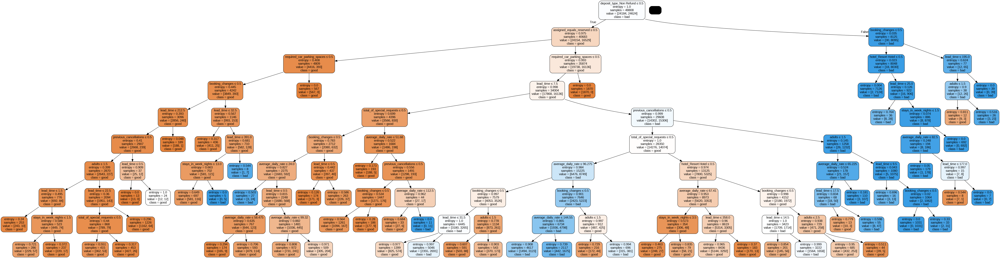

In [222]:
from six import StringIO #IMPRIMO EL ARBOL
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
import matplotlib.pyplot as plt

dot_data = StringIO()
export_graphviz(arbol6, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names=features6,
                class_names=['good','bad'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [223]:
df_submission = pd.DataFrame({'id':df_test['id'], 'is_canceled':predicciones6})
df_submission.head()
df_submission.shape

(26193, 2)

In [224]:
#df_submission.to_csv('/content/drive/MyDrive/submissions/submission_v6.csv', index=False)

In [225]:
joblib.dump(arbol6, 'arbol6.pkl')

['arbol6.pkl']

#Arbol de decision N7

In [226]:
features7= ['lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest',
       'previous_cancellations', 'previous_bookings_not_canceled','booking_changes',
        'days_in_waiting_list',
       'average_daily_rate', 'required_car_parking_spaces',
       'total_of_special_requests', 'hotel_Resort Hotel',
       'meal_FB', 'meal_HB', 'meal_SC',
       'deposit_type_Non Refund', 'deposit_type_Refundable','assigned_equals_reserved']

In [227]:
x_train, x_test, y_train, y_test = train_test_split(dataset[features7].values, 
                                                    dataset[target].values, 
                                                    test_size=0.2,    #20% al conjunto de test 80/20
                                                    random_state=13,  #para poder reproducir el experimento
                                                    stratify=dataset[target].values) #estratificado para mantener proporcion #QUEREMOS QUE SE RESPETE LA DIST DE LAS CLASES, APRENDER DE LAS 2 CLASES

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

#Verifico como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48808
# Datos Prueba: 12203
% Positivos Entrenamiento: 50.451
% Positivos Prueba: 50.455


In [228]:
##KFOLD CV Random Search para buscar el mejor arbol (los mejores atributos, hiperparametros,etc)
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer

#Cantidad de combinaciones que quiero porbar
n=30 #LE PIDO QUE ME ARME 20 COMB POR CADA SPLIT(ENTRENA 20 ARBOLES POR CADA SPLIT)

#Conjunto de parámetros que quiero usar GRILLA DE PARAMETROS
params_grid = {'criterion':['gini','entropy'], #LE DOY POSIBLES CRITERIOS DE PARAMETROS 
               #'min_samples_leaf':list(range(1,10)),
               #'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0,0.005,n), #UN RANGO DE ALPHA(PODA) CON N CORTES, AUNQUE PODIA SER UN N MAYOR A 10
               'max_depth':list(range(9,15))} #RANGO DE PROFUNDIDAD
                
#Cantidad de splits para el Cross Validation
folds=40 #IGUAL QUE EN EL DIBUJO CUANTAS CECES LO QUIERO PARTIR Y ENTRENAR

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds) #5 FOLDS ESTRATIFICADOS RESPETE LA PROPORCION DE LA CLASE, EN LA MISMA PROPORCION ORIGINAL 

#Clasificador ARMO MI CLASIFICADOR 
base_tree = DecisionTreeClassifier() 

#Metrica que quiero optimizar F1 Score
scorer_fn = make_scorer(sk.metrics.f1_score) #ACA DECIDO QUE MI MEJOR CONJUNTO SEA A BSAE DE MEDIR F1 SCORE 

#Random Search Cross Validation BUSCADOR RANDOM CON VALIDACION CRUZADA
randomcv = RandomizedSearchCV(estimator=base_tree, #CREO MI VALIDACION CRUZADA con busqueda random de hiperparametros RANDOM SEARCH
                              param_distributions = params_grid,
                              scoring=scorer_fn, #METRICA QUE QUUIERO OPTIMIZAR
                              cv=kfoldcv,
                              n_iter=n) #LO TENER QUE HACER 10 VECES, PORQUE ES LA CANT DE HIPERPARAMETROS  

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train); #LO ENTRENO SOBRE MI DATASET DE ENTRENAMIENTO

In [229]:
#Mejores hiperparametros del arbol
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_)

{'max_depth': 12, 'criterion': 'entropy', 'ccp_alpha': 0.0}
0.7484492081750094


In [230]:
#Atributos considerados y su importancia
best_tree = randomcv.best_estimator_ #ME DEVUELVE MI MEJOR ARBOL
feat_imps = best_tree.feature_importances_ #AL MEJOR ARBOL LE PIDO SUS MEJORES FEATURES

for feat_imp,feat in sorted(zip(feat_imps,features7)): 
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

babies: 0.0001534345294514765
meal_FB: 0.0004070367976092854
is_repeated_guest: 0.0013762161772876602
children: 0.004132532695916841
stays_in_weekend_nights: 0.00469585552817146
days_in_waiting_list: 0.005307796281261756
meal_HB: 0.006211602752960722
meal_SC: 0.0067589199323629875
stays_in_week_nights: 0.008003593750348977
adults: 0.010813727906987538
hotel_Resort Hotel: 0.011087016474208337
previous_bookings_not_canceled: 0.011296233215165348
booking_changes: 0.030729698956319825
total_of_special_requests: 0.03472696903269831
previous_cancellations: 0.056912622211071164
average_daily_rate: 0.06510678478676873
required_car_parking_spaces: 0.08734658746605099
assigned_equals_reserved: 0.1035204369758729
lead_time: 0.10769305550828032
deposit_type_Non Refund: 0.4437198790212054


In [231]:
#Creo el árbol con los mejores hiperparámetros
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

arbol7=DecisionTreeClassifier().set_params(**randomcv.best_params_)

#Entreno el arbol en todo el set
arbol7.fit(x_train,y_train) #LO ENTRENO CON TODO EL SET DE ENTRENAMIENTO

reglas = export_text(arbol7, feature_names=list(features7)) #IMPRIMO TODAS LAS REGLAS
print(reglas)

|--- deposit_type_Non Refund <= 0.50
|   |--- assigned_equals_reserved <= 0.50
|   |   |--- required_car_parking_spaces <= 0.50
|   |   |   |--- booking_changes <= 0.50
|   |   |   |   |--- lead_time <= 212.50
|   |   |   |   |   |--- previous_cancellations <= 0.50
|   |   |   |   |   |   |--- adults <= 1.50
|   |   |   |   |   |   |   |--- lead_time <= 1.50
|   |   |   |   |   |   |   |   |--- is_repeated_guest <= 0.50
|   |   |   |   |   |   |   |   |   |--- average_daily_rate <= 55.50
|   |   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |   |--- average_daily_rate >  55.50
|   |   |   |   |   |   |   |   |   |   |--- average_daily_rate <= 107.10
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 2
|   |   |   |   |   |   |   |   |   |   |--- average_daily_rate >  107.10
|   |   |   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |--- is_repeated_guest >  0.50
|   |   |   |   |   |   |   |   |   |-

In [232]:
y_pred = arbol7.predict(x_test)

In [233]:
accuracy=accuracy_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)

print("Accuracy: "+str(accuracy)) 
print("Recall: "+str(recall))
print("Precision: "+str(precision))
print("f1 score: "+str(f1))

Accuracy: 0.7658772433008276
Recall: 0.6931947376969303
Precision: 0.8151260504201681
f1 score: 0.7492319845519178


In [234]:
prueba7 = df_test[['lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest',
       'previous_cancellations', 'previous_bookings_not_canceled','booking_changes',
        'days_in_waiting_list',
       'average_daily_rate', 'required_car_parking_spaces',
       'total_of_special_requests', 'hotel_Resort Hotel',
       'meal_FB', 'meal_HB', 'meal_SC',
       'deposit_type_Non Refund', 'deposit_type_Refundable','assigned_equals_reserved']]

In [235]:
predicciones7 = arbol7.predict(prueba7)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


In [236]:
from six import StringIO #IMPRIMO EL ARBOL
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
import matplotlib.pyplot as plt

dot_data = StringIO()
export_graphviz(arbol7, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names=features7,
                class_names=['good','bad'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.898366 to fit



In [237]:
df_submission = pd.DataFrame({'id':df_test['id'], 'is_canceled':predicciones7})
df_submission.head()
df_submission.shape

(26193, 2)

In [238]:
#df_submission.to_csv('/content/drive/MyDrive/submissions/submission_v7.csv', index=False)

In [239]:
joblib.dump(arbol7, 'arbol7.pkl')

['arbol7.pkl']

#Arbol de decision N8

In [240]:
features8=['lead_time',
       'stays_in_week_nights', 'adults',
       'previous_cancellations', 'previous_bookings_not_canceled','booking_changes',
        'days_in_waiting_list',
       'average_daily_rate', 'required_car_parking_spaces',
       'total_of_special_requests', 'hotel_Resort Hotel',
       'deposit_type_Non Refund','assigned_equals_reserved', 'temporada_alta']

In [241]:
x_train, x_test, y_train, y_test = train_test_split(dataset[features8].values, 
                                                    dataset[target].values, 
                                                    test_size=0.2,    #20% al conjunto de test 80/20
                                                    random_state=13,  #para poder reproducir el experimento
                                                    stratify=dataset[target].values) #estratificado para mantener proporcion #QUEREMOS QUE SE RESPETE LA DIST DE LAS CLASES, APRENDER DE LAS 2 CLASES

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

#Verifico como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48808
# Datos Prueba: 12203
% Positivos Entrenamiento: 50.451
% Positivos Prueba: 50.455


In [242]:
##KFOLD CV Random Search para buscar el mejor arbol (los mejores atributos, hiperparametros,etc)
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer

#Cantidad de combinaciones que quiero porbar
n=30 #LE PIDO QUE ME ARME 20 COMB POR CADA SPLIT(ENTRENA 20 ARBOLES POR CADA SPLIT)

#Conjunto de parámetros que quiero usar GRILLA DE PARAMETROS
params_grid = {'criterion':['gini','entropy'], #LE DOY POSIBLES CRITERIOS DE PARAMETROS 
               #'min_samples_leaf':list(range(1,10)),
               #'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0,0.005,n), #UN RANGO DE ALPHA(PODA) CON N CORTES, AUNQUE PODIA SER UN N MAYOR A 10
               'max_depth':list(range(9,15))} #RANGO DE PROFUNDIDAD
                
#Cantidad de splits para el Cross Validation
folds=40 #IGUAL QUE EN EL DIBUJO CUANTAS CECES LO QUIERO PARTIR Y ENTRENAR

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds) #5 FOLDS ESTRATIFICADOS RESPETE LA PROPORCION DE LA CLASE, EN LA MISMA PROPORCION ORIGINAL 

#Clasificador ARMO MI CLASIFICADOR 
base_tree = DecisionTreeClassifier() 

#Metrica que quiero optimizar F1 Score
scorer_fn = make_scorer(sk.metrics.f1_score) #ACA DECIDO QUE MI MEJOR CONJUNTO SEA A BSAE DE MEDIR F1 SCORE 

#Random Search Cross Validation BUSCADOR RANDOM CON VALIDACION CRUZADA
randomcv = RandomizedSearchCV(estimator=base_tree, #CREO MI VALIDACION CRUZADA con busqueda random de hiperparametros RANDOM SEARCH
                              param_distributions = params_grid,
                              scoring=scorer_fn, #METRICA QUE QUUIERO OPTIMIZAR
                              cv=kfoldcv,
                              n_iter=n) #LO TENER QUE HACER 10 VECES, PORQUE ES LA CANT DE HIPERPARAMETROS  

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train); #LO ENTRENO SOBRE MI DATASET DE ENTRENAMIENTO

In [243]:
#Mejores hiperparametros del arbol PROBASTE 10 DECIME CUAL FUE EL DE LA MEJOR METRICAS
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_) #0.7555114548598617 antes teniamos este con prfundidad 14

{'max_depth': 10, 'criterion': 'gini', 'ccp_alpha': 0.0005172413793103448}
0.7502178107301137


In [244]:
#Atributos considerados y su importancia
best_tree = randomcv.best_estimator_ #ME DEVUELVE MI MEJOR ARBOL
feat_imps = best_tree.feature_importances_ #AL MEJOR ARBOL LE PIDO SUS MEJORES FEATURES

for feat_imp,feat in sorted(zip(feat_imps,features8)): #ME DIJO CON EL ALCOHOL Y SULFATOS TE PUEDO ARMAR UN BUEN CLASIFICADOR (EL ALCOHOL TIENE BUENA CORRELACION CON EL TARGET LO VIMOS EN EL HEATMAP)
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

adults: 0.004866067626085342
hotel_Resort Hotel: 0.006677995789399552
booking_changes: 0.028319154779997805
total_of_special_requests: 0.045235884609062624
average_daily_rate: 0.046630225484366884
previous_cancellations: 0.05834259371063968
required_car_parking_spaces: 0.07404718122455838
lead_time: 0.10933470599360287
assigned_equals_reserved: 0.12276094082687534
deposit_type_Non Refund: 0.5037852499554115


In [245]:
#Creo el árbol con los mejores hiperparámetros
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

arbol8=DecisionTreeClassifier().set_params(**randomcv.best_params_)

#Entreno el arbol en todo el set
arbol8.fit(x_train,y_train) #LO ENTRENO CON TODO EL SET DE ENTRENAMIENTO

reglas = export_text(arbol8, feature_names=list(features8)) #IMPRIMO TODAS LAS REGLAS
print(reglas)

|--- deposit_type_Non Refund <= 0.50
|   |--- assigned_equals_reserved <= 0.50
|   |   |--- class: 0
|   |--- assigned_equals_reserved >  0.50
|   |   |--- lead_time <= 11.50
|   |   |   |--- required_car_parking_spaces <= 0.50
|   |   |   |   |--- lead_time <= 7.50
|   |   |   |   |   |--- total_of_special_requests <= 0.50
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- total_of_special_requests >  0.50
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |--- lead_time >  7.50
|   |   |   |   |   |--- class: 0
|   |   |   |--- required_car_parking_spaces >  0.50
|   |   |   |   |--- class: 0
|   |   |--- lead_time >  11.50
|   |   |   |--- required_car_parking_spaces <= 0.50
|   |   |   |   |--- previous_cancellations <= 0.50
|   |   |   |   |   |--- total_of_special_requests <= 0.50
|   |   |   |   |   |   |--- average_daily_rate <= 93.01
|   |   |   |   |   |   |   |--- booking_changes <= 0.50
|   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |  

In [246]:
y_pred = arbol8.predict(x_test)

In [247]:
accuracy=accuracy_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)

print("Accuracy: "+str(accuracy)) 
print("Recall: "+str(recall))
print("Precision: "+str(precision))
print("f1 score: "+str(f1))

Accuracy: 0.7533393427845612
Recall: 0.7800877050511613
Precision: 0.7436135624709708
f1 score: 0.76141407736208


In [248]:
prueba8 = df_test[['lead_time',
       'stays_in_week_nights', 'adults',
       'previous_cancellations', 'previous_bookings_not_canceled','booking_changes',
        'days_in_waiting_list',
       'average_daily_rate', 'required_car_parking_spaces',
       'total_of_special_requests', 'hotel_Resort Hotel',
       'deposit_type_Non Refund','assigned_equals_reserved', 'temporada_alta']]

In [249]:
predicciones8 = arbol8.predict(prueba8)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


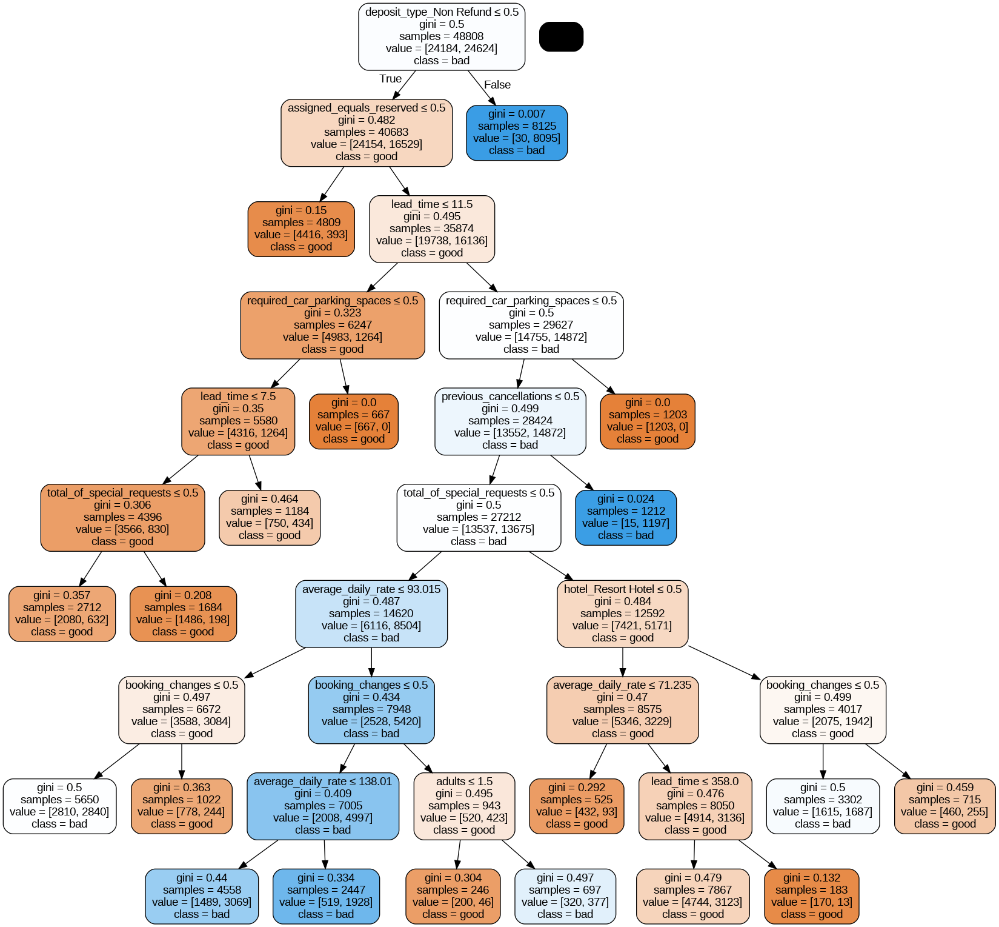

In [250]:
from six import StringIO #IMPRIMO EL ARBOL
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
import matplotlib.pyplot as plt

dot_data = StringIO()
export_graphviz(arbol8, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names=features8,
                class_names=['good','bad'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [251]:
df_submission = pd.DataFrame({'id':df_test['id'], 'is_canceled':predicciones8})
df_submission.head()
df_submission.shape

(26193, 2)

In [252]:
#df_submission.to_csv('/content/drive/MyDrive/submissions/submission_v8.csv', index=False)

In [253]:
joblib.dump(arbol8, 'arbol8.pkl')

['arbol8.pkl']

#Arbol de decision N9

In [254]:
dataset.columns

Index(['arrival_date', 'lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'agent',
       'days_in_waiting_list', 'average_daily_rate',
       'required_car_parking_spaces', 'total_of_special_requests', 'id',
       'is_canceled', 'assigned_equals_reserved', 'temporada_alta',
       'hotel_Resort Hotel', 'meal_FB', 'meal_HB', 'meal_SC',
       'deposit_type_Non Refund', 'deposit_type_Refundable',
       'customer_type_Group', 'customer_type_Transient',
       'customer_type_Transient-Party', 'country_BEL', 'country_BRA',
       'country_CHE', 'country_CHN', 'country_CN', 'country_DEU',
       'country_ESP', 'country_FRA', 'country_GBR', 'country_IRL',
       'country_ISR', 'country_ITA', 'country_NLD', 'country_NOR',
       'country_OTHER', 'country_POL', 'country_PRT', 'c

In [255]:
features9= ['deposit_type_Non Refund','lead_time','average_daily_rate','assigned_equals_reserved','previous_cancellations', 
'required_car_parking_spaces','booking_changes','stays_in_week_nights','adults','hotel_Resort Hotel','total_of_special_requests',
'customer_type_Group', 'customer_type_Transient','customer_type_Transient-Party','country_PRT', 'country_GBR',
'country_FRA','country_ESP','country_DEU', 'distribution_channel_TA/TO','market_segment_Offline TA/TO', 'market_segment_Online TA']

In [256]:
x_train, x_test, y_train, y_test = train_test_split(dataset[features9].values, 
                                                    dataset[target].values, 
                                                    test_size=0.2,    #20% al conjunto de test 80/20
                                                    random_state=13,  #para poder reproducir el experimento
                                                    stratify=dataset[target].values) #estratificado para mantener proporcion #QUEREMOS QUE SE RESPETE LA DIST DE LAS CLASES, APRENDER DE LAS 2 CLASES

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

#Verifico como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48808
# Datos Prueba: 12203
% Positivos Entrenamiento: 50.451
% Positivos Prueba: 50.455


In [257]:
##KFOLD CV Random Search para buscar el mejor arbol (los mejores atributos, hiperparametros,etc)
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer

#Cantidad de combinaciones que quiero porbar
n=30 #LE PIDO QUE ME ARME 20 COMB POR CADA SPLIT(ENTRENA 20 ARBOLES POR CADA SPLIT)

#Conjunto de parámetros que quiero usar GRILLA DE PARAMETROS
params_grid = {'criterion':['gini','entropy'], #LE DOY POSIBLES CRITERIOS DE PARAMETROS 
               #'min_samples_leaf':list(range(1,10)),
               #'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0.001,0.005,n), #UN RANGO DE ALPHA(PODA) CON N CORTES, AUNQUE PODIA SER UN N MAYOR A 10
               'max_depth':list(range(15,24))} #RANGO DE PROFUNDIDAD
                
#Cantidad de splits para el Cross Validation
folds=40 #IGUAL QUE EN EL DIBUJO CUANTAS CECES LO QUIERO PARTIR Y ENTRENAR

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds) #5 FOLDS ESTRATIFICADOS RESPETE LA PROPORCION DE LA CLASE, EN LA MISMA PROPORCION ORIGINAL 

#Clasificador ARMO MI CLASIFICADOR 
base_tree = DecisionTreeClassifier() 

#Metrica que quiero optimizar F1 Score
scorer_fn = make_scorer(sk.metrics.f1_score) #ACA DECIDO QUE MI MEJOR CONJUNTO SEA A BSAE DE MEDIR F1 SCORE 

#Random Search Cross Validation BUSCADOR RANDOM CON VALIDACION CRUZADA
randomcv = RandomizedSearchCV(estimator=base_tree, #CREO MI VALIDACION CRUZADA con busqueda random de hiperparametros RANDOM SEARCH
                              param_distributions = params_grid,
                              scoring=scorer_fn, #METRICA QUE QUUIERO OPTIMIZAR
                              cv=kfoldcv,
                              n_iter=n) #LO TENER QUE HACER 10 VECES, PORQUE ES LA CANT DE HIPERPARAMETROS  

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train); #LO ENTRENO SOBRE MI DATASET DE ENTRENAMIENTO

In [258]:
#Mejores hiperparametros del arbol 
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_) 

{'max_depth': 21, 'criterion': 'entropy', 'ccp_alpha': 0.0015517241379310346}
0.8156934344775578


In [259]:
#Atributos considerados y su importancia
best_tree = randomcv.best_estimator_ #ME DEVUELVE MI MEJOR ARBOL
feat_imps = best_tree.feature_importances_ #AL MEJOR ARBOL LE PIDO SUS MEJORES FEATURES

for feat_imp,feat in sorted(zip(feat_imps,features9)): 
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

hotel_Resort Hotel: 0.003677904005776593
stays_in_week_nights: 0.004655943117196475
customer_type_Transient-Party: 0.004902402408844279
booking_changes: 0.0072201583199304606
average_daily_rate: 0.01560248738056363
distribution_channel_TA/TO: 0.01793921086900823
customer_type_Transient: 0.02368359946284242
previous_cancellations: 0.03115894585439488
total_of_special_requests: 0.05771554392399134
lead_time: 0.06741210617114696
required_car_parking_spaces: 0.07251000582727166
country_PRT: 0.07955952291272683
assigned_equals_reserved: 0.0897607749540269
market_segment_Online TA: 0.13945958566783412
deposit_type_Non Refund: 0.3847418091244453


In [260]:
#Creo el árbol con los mejores hiperparámetros
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

arbol9=DecisionTreeClassifier().set_params(**randomcv.best_params_)

#Entreno el arbol en todo el set
arbol9.fit(x_train,y_train) #LO ENTRENO CON TODO EL SET DE ENTRENAMIENTO

reglas = export_text(arbol9, feature_names=list(features9)) #IMPRIMO TODAS LAS REGLAS
print(reglas)

|--- deposit_type_Non Refund <= 0.50
|   |--- assigned_equals_reserved <= 0.50
|   |   |--- country_PRT <= 0.50
|   |   |   |--- class: 0
|   |   |--- country_PRT >  0.50
|   |   |   |--- class: 0
|   |--- assigned_equals_reserved >  0.50
|   |   |--- required_car_parking_spaces <= 0.50
|   |   |   |--- lead_time <= 7.50
|   |   |   |   |--- country_PRT <= 0.50
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- country_PRT >  0.50
|   |   |   |   |   |--- class: 0
|   |   |   |--- lead_time >  7.50
|   |   |   |   |--- country_PRT <= 0.50
|   |   |   |   |   |--- market_segment_Online TA <= 0.50
|   |   |   |   |   |   |--- distribution_channel_TA/TO <= 0.50
|   |   |   |   |   |   |   |--- customer_type_Transient <= 0.50
|   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |--- customer_type_Transient >  0.50
|   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |--- distribution_channel_TA/TO >  0.50
|   |   |   |   |   |   |   |--- previous_c

In [261]:
y_pred = arbol9.predict(x_test)

In [262]:
accuracy=accuracy_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)

print("Accuracy: "+str(accuracy)) 
print("Recall: "+str(recall))
print("Precision: "+str(precision))
print("f1 score: "+str(f1))

Accuracy: 0.8141440629353438
Recall: 0.7834984570407666
Precision: 0.8376454245528737
f1 score: 0.8096676737160121


In [263]:
prueba9 = df_test[['deposit_type_Non Refund', 'lead_time','average_daily_rate','assigned_equals_reserved','previous_cancellations', 'required_car_parking_spaces', 'booking_changes','stays_in_week_nights','adults', 'hotel_Resort Hotel','total_of_special_requests','customer_type_Group', 'customer_type_Transient',
       'customer_type_Transient-Party','country_PRT', 'country_GBR','country_FRA','country_ESP','country_DEU', 'distribution_channel_TA/TO','market_segment_Offline TA/TO', 'market_segment_Online TA']]

In [264]:
predicciones9 = arbol9.predict(prueba9)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


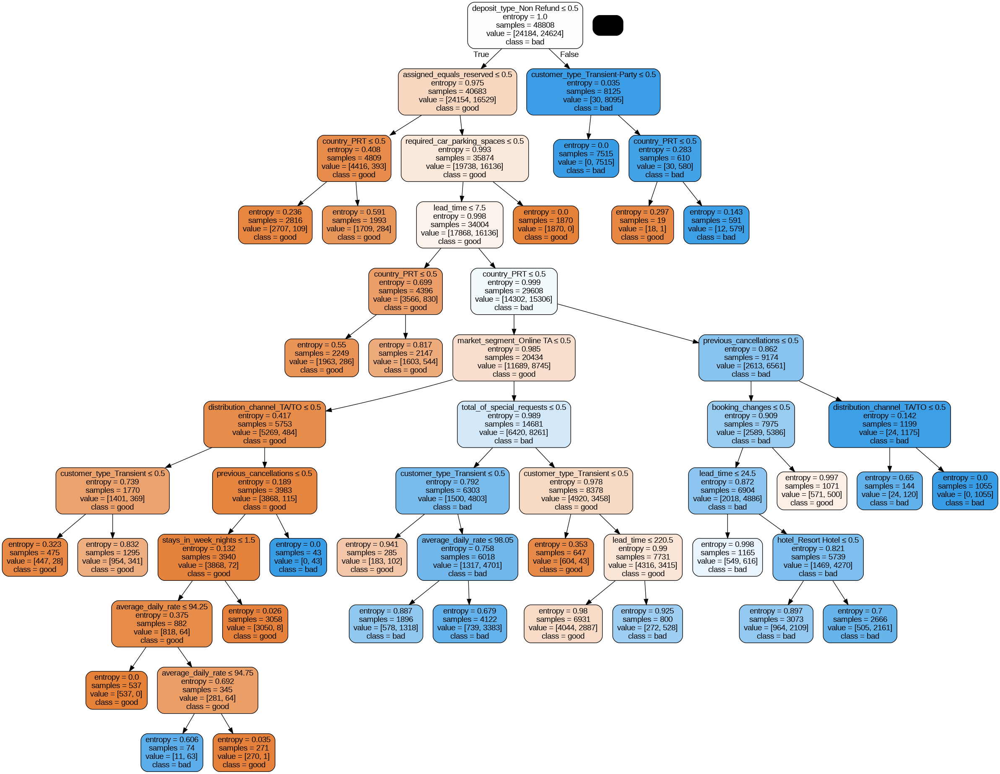

In [265]:
from six import StringIO #IMPRIMO EL ARBOL
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
import matplotlib.pyplot as plt

dot_data = StringIO()
export_graphviz(arbol9, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names=features9,
                class_names=['good','bad'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [266]:
df_submission = pd.DataFrame({'id':df_test['id'], 'is_canceled':predicciones9})
df_submission.head()
df_submission.shape

(26193, 2)

In [267]:
#df_submission.to_csv('/content/drive/MyDrive/submissions/submission_v10.csv', index=False)

# Matriz de Confusion

In [268]:
y_pred = arbol9.predict(x_test)

Text(50.722222222222214, 0.5, 'True')

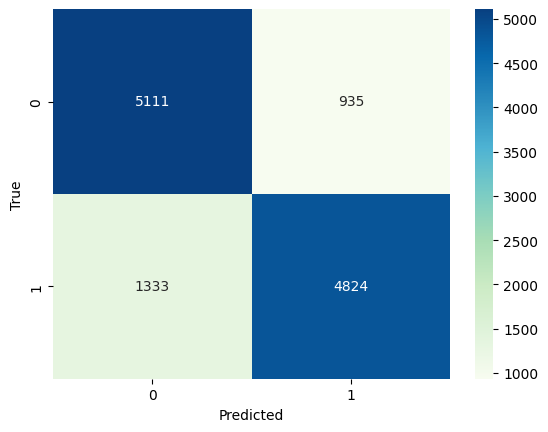

In [269]:
#Creo la matriz de confusión
tabla=confusion_matrix(y_test, y_pred)

#Grafico la matriz de confusión
sns.heatmap(tabla,cmap='GnBu',annot=True,fmt='g')
plt.xlabel('Predicted')
plt.ylabel('True')

# Performance

In [270]:
accuracy=accuracy_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)

print("Accuracy: "+str(accuracy)) 
print("Recall: "+str(recall))
print("Precision: "+str(precision))
print("f1 score: "+str(f1))

Accuracy: 0.8141440629353438
Recall: 0.7834984570407666
Precision: 0.8376454245528737
f1 score: 0.8096676737160121


In [271]:
joblib.dump(arbol9, 'arbol9.pkl')

['arbol9.pkl']